In [1]:
import scanpy as sc
import pandas as pd
import numpy as np

In [2]:
adata1 = sc.read_h5ad('../data/covid19/subdata/RNA_1.h5ad')
adata2 = sc.read_h5ad('../data/covid19/subdata/RNA_4.h5ad')
# subdata1 = adata1[adata1.obs['minor_subset'].isin(['CD8.TEMRA','CD8.NAIVE','CD4.NAIVE'])]
# subdata2 = adata2[adata2.obs['minor_subset'].isin(['CD8.TEMRA','CD4.NAIVE'])]

In [35]:
adata1.obs['minor_subset'].value_counts()

CD4.NAIVE                   15413
cMono                       14689
CD4.TCM                     12388
NK.CD16hi                    8744
CD8.TEMRA                    6109
ncMono                       4073
CD8.NAIVE                    3080
CD8.TEM                      2766
B.NAIVE                      1397
cDC                          1367
CD4.TREG                     1301
CD8.mitohi                   1286
NK.mitohi                    1263
MAIT                         1254
CD8.TCM.CCL5                 1239
NK.CD56hi.CD16int.XCL1/2     1097
CD4.TEFF                      989
B.INT                         932
CD4.TEM/TEMRA                 906
B.MEM                         891
CD8.TCM                       826
DP                            825
pDC                           663
GDT.VD2                       622
DN                            548
GDT.VD2neg                    489
NK.CD16int                    411
NK.cyc                        302
nan                           244
CD8.TEFF.proli

In [429]:
allct = adata1.obs['minor_subset'].value_counts().keys()
cts = list(allct[2:7])
subdata1 = adata1[adata1.obs['minor_subset'].isin(['CD8.TEMRA','CD8.NAIVE'])] #,'CD8.TCM','CD8.NAIVE'
subdata2 = adata2[adata2.obs['minor_subset'].isin(['CD8.TEMRA','CD8.NAIVE','CD8.TEM'])] #['CD4.TCM','CD4.TEFF','CD4.TREG']

In [4]:
def scanpypp(adata):
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    # adata.var["mt"] = adata.var_names.str.startswith("MT-")
    # sc.pp.calculate_qc_metrics(
    # adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True)
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    # sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
    # sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")
    sc.pp.highly_variable_genes(adata,min_mean=0.15,max_mean=2.5,min_disp=0.5)
    sc.pl.highly_variable_genes(adata)
    adata = adata[:,adata.var.highly_variable]
    sc.pp.scale(adata)
    sc.pp.pca(adata, n_comps=50)
    return adata

In [430]:
adata = sc.concat([subdata1,subdata2],axis=0)

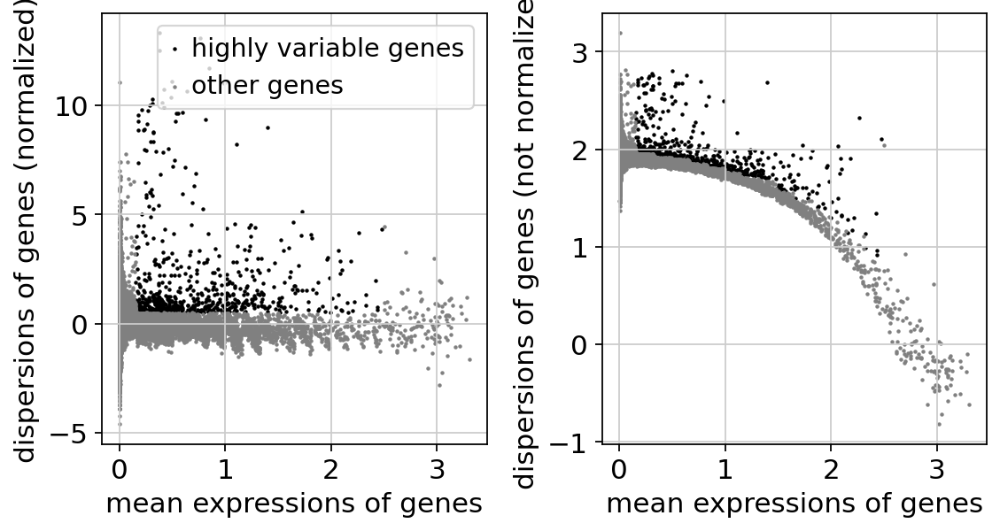

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [431]:
adata_pp = scanpypp(adata.copy())

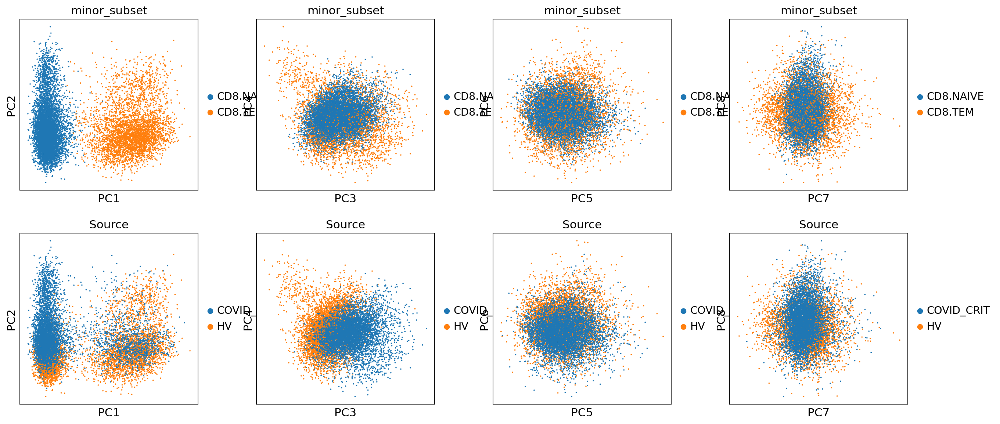

In [303]:
sc.pl.pca(adata_pp, components=['1,2','3,4','5,6','7,8'],color=['minor_subset','Source'])


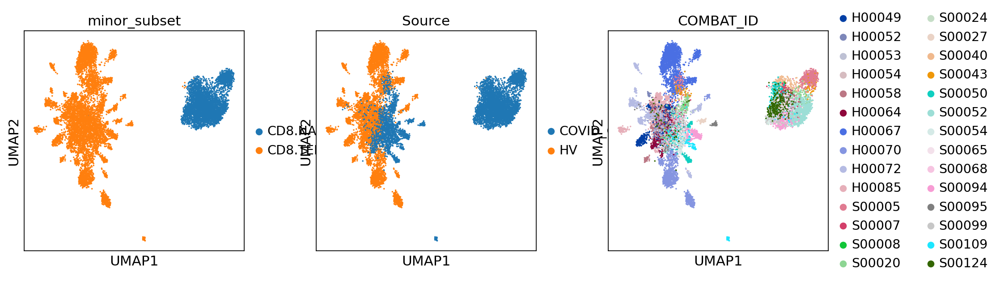

In [419]:
# adata_pp = adata_pp[:,good_genes]
# sc.pp.pca(adata_pp,n_comps=50)
# sc.external.pp.harmony_integrate(adata_pp, key='COMBAT_ID')
# sc.pp.neighbors(adata_pp, n_neighbors=20, key_added='harmony',use_rep='X_pca_harmony')
# sc.tl.umap(adata_pp, neighbors_key='harmony')

sc.pp.neighbors(adata_pp, n_neighbors=20,use_rep='X_pca')
sc.tl.umap(adata_pp)
sc.pl.umap(adata_pp, color=['minor_subset','Source','COMBAT_ID'])

# sc.tl.leiden(adata_pp,resolution=0.3)
# sc.pl.umap(adata_pp, color=['minor_subset','leiden','Source'])

In [115]:
adata_pp.uns['COMBAT_ID_colors'] = None

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


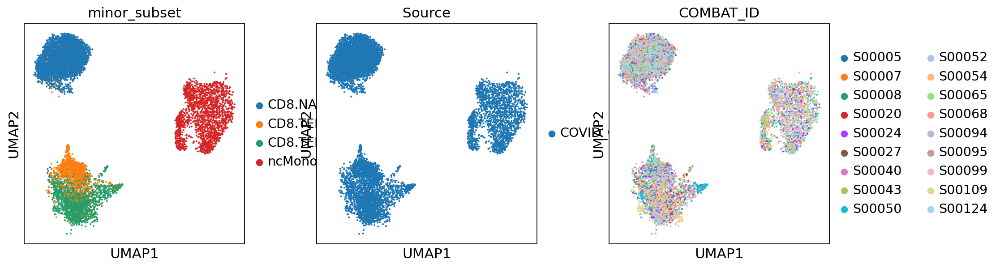

In [117]:

sc.pl.umap(adata_pp[adata_pp.obs['Source']!='HV'], color=['minor_subset','Source','COMBAT_ID'])

In [ ]:
from scalable_gcca import learn
ppdata = {}
for i in rnadata.keys():
# print('before pp',i,rnadata[i].shape
    # print(len(rnadata[i]))
    # if len(rnadata[i]) not in ([968,1069,446,653]):
    #     continue
    if len(rnadata[i]) < 100:
        continue
    
    if rnadata[i].shape[0] > 500:
        
        rand = np.random.choice(rnadata[i].shape[0]-1, 500,replace=False)
        rnadata[i] = rnadata[i][rand,:]

    adata = rnadata[i].copy()
    # print(sum(adata.X.toarray()[:100,:100]))
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata,min_disp=0.5)

    # adata = adata[:,adata.var.highly_variable]
    # sc.pp.scale(adata)
    # sc.pp.pca(adata, n_comps=100)
    # ppdata[i] = sparse.csr_matrix(adata.obsm['X_pca'].T)

    ppdata[i] = adata[:,adata.var['highly_variable']]
    gene_list  = gene_list & set(list(ppdata[i].var_names))

    data_cc = {}
    if len(ppdata.keys()) < 2:
        for i in ppdata.keys():
            # temp = normalize(ppdata[i][:5,:].T,copy=True)
            data_cc[i] = pd.DataFrame(data=temp,index=rnadata[i].obs_names,columns=['CC_'+str(k+1) for k in range(5)])

    # for i in ppdata.keys():
    #     if isspmatrix_csr(ppdata[i].X):
    #         ppdata[i] = ppdata[i][:,list(gene_list)].X.toarray().T
    #     else:
    #         ppdata[i] = ppdata[i][:,list(gene_list)].X.T
        
    # logging.root.setLevel(level=logging.INFO)
    # gcca = GCCA(n_components=5)
    # gcca.fit(ppdata)
    # cca_loading = gcca.h_list
    # print(gcca.eigvals[:5])

    # print(ppdata.values())
    model = learn(list(ppdata.values()), k=5, epochs=10, verbose=False)
    cca_loading = model.Qs

In [121]:
import numpy as np
from scipy.spatial import distance
from sklearn.mixture import GaussianMixture
from scipy.stats import gaussian_kde

# def bhattacharyya_dist(mu1, mu2, Sigma1, Sigma2):
#     Sig = (Sigma1+Sigma2)/2
#     print(mu1.shape,Sigma1.shape)
#     if len(mu1) ==1:
#         ldet_s = np.linalg.det(Sig)
#         ldet_s1 = np.linalg.det(Sigma1)
#         ldet_s2 = np.linalg.det(Sigma2)
#         d1 = distance.mahalanobis(mu1, mu2, np.linalg.inv(Sig))**2/8
#         d2 = 0.5*np.log(ldet_s) - 0.25*np.log(ldet_s1) - 0.25*np.log(ldet_s2)
#     else:
#         d1 = distance.mahalanobis(mu1, mu2, 1/Sig)**2/8
#         d2 = 0.5*np.log(1/Sig) - 0.25*np.log(1/Sigma1) - 0.25*np.log(1/Sigma2)
#     return d1+d2

# def bhattacharyya_distance(P, Q):
#     # 计算 Bhattacharyya 系数
#     BC = np.sum(np.sqrt(P * Q))
#     # 计算 Bhattacharyya 距离
#     if BC == 0:
#         return np.inf  # 如果 BC 为 0，距离为无穷大
#     return -np.log(BC)

def bhattacharyya_distance(P, Q, points=1000):
    # 使用核密度估计拟合概率密度函数
    kde_P = gaussian_kde(P)
    kde_Q = gaussian_kde(Q)
    
    # 定义积分区间
    x_min = min(P.min(), Q.min())
    x_max = max(P.max(), Q.max())
    x = np.linspace(x_min, x_max, points)
    
    # 计算 Bhattacharyya 系数
    BC = np.trapz(np.sqrt(kde_P(x) * kde_Q(x)), x)
    
    # 计算 Bhattacharyya 距离
    if BC == 0:
        return np.inf  # 如果 BC 为 0，距离为无穷大
    return -np.log(BC)

def gm1or2(x1,x2):
    x1 =  x1.reshape(-1, 1)
    x2 =  x2.reshape(-1, 1)
    gmm = GaussianMixture(1, covariance_type='full')
    ll1 = gmm.fit(x1).lower_bound_ * len(x1) / (len(x1)+len(x2))

    ll2 = gmm.fit(x2).lower_bound_ * len(x1) / (len(x1)+len(x2))

    ll = gmm.fit(np.concatenate([x1,x2])).lower_bound_ 

    ll_gain = (ll1 + ll2) - ll

    return ll_gain


In [334]:
### PLS function

from sklearn.cross_decomposition import CCA,PLSCanonical,PLSRegression

def pls(data1, data2):
    plsc = PLSCanonical(n_components=20)
    plsc.fit(data1, data2)
    cell_rep1, cell_rep2 = normalize(plsc.x_weights_), normalize(plsc.y_weights_)
    diff = {}
    for i in range(cell_rep1.shape[1]):
        # diff[i+1] = gm1or2(cell_rep1[:,i],cell_rep2[:,i])
        diff[i+1] = bhattacharyya_distance(cell_rep1[:,i], cell_rep2[:,i])

    gene_vec1, gene_vec2 = plsc.transform(data1, data2)
    gene_vec1 = pd.DataFrame(index=data1.index, data=gene_vec1, columns=range(1,gene_vec1.shape[1]+1))
    gene_vec2 = pd.DataFrame(index=data2.index, data=gene_vec2, columns=range(1,gene_vec2.shape[1]+1))
    gene_vec = [gene_vec1, gene_vec2]

    bio_genes, cnd_genes = set(), set()

    for k in range(2):

        data = gene_vec[k]
        iqr = data.quantile([0.25, 0.5, 0.75])
        iqr.loc['iqr', :] = (iqr.loc[0.75, :] - iqr.loc[0.25, :])
        iqr.loc['min', :] = iqr.loc[0.25, :]-iqr.loc['iqr', :]
        iqr.loc['max', :] = iqr.loc[0.75, :]+iqr.loc['iqr', :]
        # print(iqr)

        for i in diff.keys():
            if diff[i] > 0.15:
                cnd_genes.update(data[data.loc[:,i]<iqr.loc['min',i]].index)
                cnd_genes.update(data[data.loc[:,i]>iqr.loc['max',i]].index)
            else:
                bio_genes.update(data[data.loc[:,i]<iqr.loc['min',i]].index)
                bio_genes.update(data[data.loc[:,i]>iqr.loc['max',i]].index)
    
    return cnd_genes, bio_genes, plsc, diff
    # if iter == 1 and len(cnd_genes) > 0:
    #     gene_list = bio_genes.difference(cnd_genes)
    # if iter == 2:
    #     gene_list 

In [ ]:
def clustering(ce1, ce2):
    

In [432]:
from sklearn.preprocessing import normalize

data1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names].X.toarray()).T,columns=subdata1.obs_names,index=adata_pp.var_names)
data2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names].X.toarray()).T,columns=subdata2.obs_names,index=adata_pp.var_names)

cnd_genes0, bio_genes0, plsc0, diff0 = pls(data1, data2)
if len(cnd_genes0) == 0:
    stop = True

gene_list = list(set(data1.index).difference(cnd_genes0))
# gene_list = list(bio_genes0.difference(cnd_genes0))
# gene_list = list(cnd_genes0)

cnd_genes, bio_genes, plsc, diff = pls(data1.loc[gene_list,:], data2.loc[gene_list,:])
cell_rep1, cell_rep2 = plsc.x_weights_, plsc.y_weights_
cell_rep1 = pd.DataFrame(index=data1.columns,columns=range(1,cell_rep1.shape[1]+1),data=cell_rep1)
cell_rep2 = pd.DataFrame(index=data2.columns,columns=range(1,cell_rep2.shape[1]+1),data=cell_rep2)
diff = pd.Series(diff)
# cell_rep1, cell_rep2 = cell_rep1[:,diff<0], cell_rep2[:,diff<0]



In [421]:
from sklearn.cross_decomposition import CCA,PLSCanonical,PLSRegression
from sklearn.preprocessing import normalize

# reference = np.dot(adata[:,list(gene_list)].X.T,adata.obsm['X_pca'][:,0])
# sc.tl.pca(adata_pp, n_comps=50)
# pc1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names].obsm['X_pca']).T,columns=subdata1.obs_names)
# pc2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names].obsm['X_pca']).T,columns=subdata2.obs_names)

pc1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names].X.toarray()).T,columns=subdata1.obs_names,index=adata_pp.var_names)
pc2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names].X.toarray()).T,columns=subdata2.obs_names,index=adata_pp.var_names)

# good_genes = list(good_genes)
# good_genes = adata_pp[:,good_genes].var_names
# pc1 = pd.DataFrame(normalize(adata_pp[subdata1.obs_names,good_genes].X.toarray()).T,columns=subdata1.obs_names,index=good_genes)
# pc2 = pd.DataFrame(normalize(adata_pp[subdata2.obs_names,good_genes].X.toarray()).T,columns=subdata2.obs_names,index=good_genes)

# rand = np.random.choice(pc1.shape[1]-1, 1000, replace=False)
# pc1 = pc1.iloc[:,rand]
# rand = np.random.choice(pc2.shape[1]-1, 1000, replace=False)
# pc2 = pc2.iloc[:,rand]

# cca = CCA(n_components=5)
# cca.fit(pc1,pc2)
plsc = PLSCanonical(n_components=5)
plsc.fit(pc1,pc2)
# plsc = PLSRegression(n_components=5)
# plsc.fit(pc1,pc2)



PLSCanonical(n_components=5)

In [127]:
from Classifier.gcca import GCCA
# model = learn(list(ppdata.values()), k=5, epochs=10, verbose=False)
# cca_loading = model.Qs
gcca = GCCA(n_components=5)
# rand = np.random.choice(pc1.shape[1]-1, 1000, replace=False)
# pc1 = pc1.iloc[:,rand]
# rand = np.random.choice(pc2.shape[1]-1, 1000, replace=False)
# pc2 = pc2.iloc[:,rand]
gcca.fit([pc1,pc2])
# cca_vector = gcca.transform([ppdata[i] for i in usedata[k]])
# print(len([ppdata[i] for i in usedata[k]]))
# print(dict(zip(usedata[k],[ppdata[i] for i in usedata[k]])))
# cca_vector = gcca.fit_transform(dict(zip(usedata[k],[ppdata[i] for i in usedata[k]])))
# cca_loading = gcca.h_list

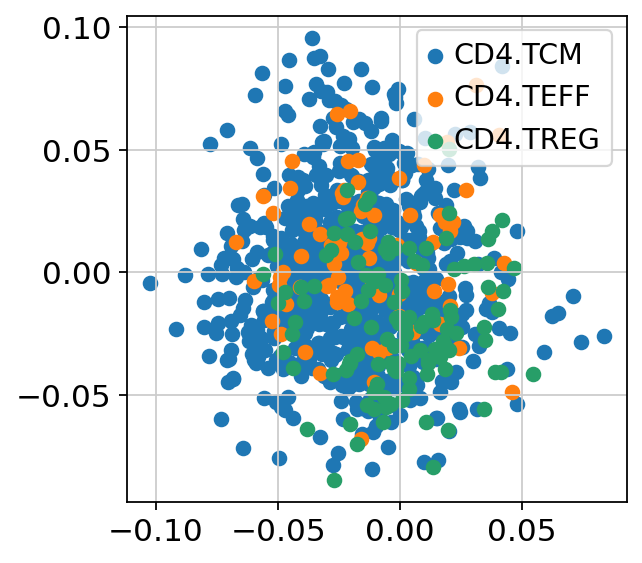

In [212]:
import matplotlib.pyplot as plt

# cca_loading = cca.x_loadings_

# cca_loading = pd.DataFrame(index=pc1.columns,data=gcca.h_list[0])
cca_loading = pd.DataFrame(index=pc2.columns,data=plsc.y_weights_)
# plt.hist(cca_loading.iloc[:,0],bins=100)
# plt.scatter(cca_loading.iloc[:,0],cca_loading.iloc[:,1])
subdata = subdata2[pc2.columns,:]
for ct in subdata.obs['minor_subset'].cat.categories:
    
    # cca_loading = pd.DataFrame(index=pc1.columns,data=plsc.x_weights_)
    # subdata = subdata1[pc1.columns,:]
    plt.scatter(cca_loading[subdata.obs['minor_subset']==ct].iloc[:,0],cca_loading[subdata.obs['minor_subset']==ct].iloc[:,1])
# plt.scatter(cca_loading[subdata.obs['minor_subset']=='CD8.TEMRA'].iloc[:,0],cca_loading[subdata.obs['minor_subset']=='CD8.TEMRA'].iloc[:,1])
# plt.scatter(cca_loading[subdata.obs['minor_subset']=='CD8.NAIVE'].iloc[:,0],cca_loading[subdata.obs['minor_subset']=='CD8.NAIVE'].iloc[:,1])
# plt.scatter(cca_loading[subdata.obs['minor_subset']=='CD8.TEM'].iloc[:,0],cca_loading[subdata.obs['minor_subset']=='CD8.TEM'].iloc[:,1])
# plt.legend(['CD8.TEMRA','CD8.NAIVE','CD8.TEM'])
plt.legend(subdata.obs['minor_subset'].cat.categories)
plt.show()

In [21]:
sc.settings.set_figure_params(dpi=80, facecolor='white')

In [407]:
diff0

{1: 0.12433580175530087,
 2: 0.09082562372638316,
 3: 0.07344226396933612,
 4: 0.028675829411000834,
 5: 0.041513271826948944,
 6: 0.006229323335107927,
 7: 0.00219431772230005,
 8: 0.001322238319553614,
 9: 0.0012668720574058009,
 10: 0.0019561649319504632,
 11: 0.004601408481888473,
 12: 0.001102601924289711,
 13: 0.0037997359130533116,
 14: 0.0008410858971857448,
 15: 0.0007186255593761712,
 16: 0.001966173031231848,
 17: 0.0014381942479927206,
 18: 0.0013452901747458387,
 19: 0.0011343441118346874,
 20: 0.001974734915809817}

In [422]:
diff0
# normalize(plsc0.x_weights_).mean()
# plsc0.x_weights_.mean(axis=0)

{1: 1.2211611650216299,
 2: 0.02084086073610698,
 3: 0.013787089202358603,
 4: 0.017055456291633797,
 5: 0.03953008843030911,
 6: 0.0006829378832954286,
 7: 0.0021065171613746905,
 8: 0.0008963988271885876,
 9: 0.0010063457820870978,
 10: 0.0005449327800898343,
 11: 0.0008575715263455268,
 12: 0.0009153224563775243,
 13: 0.001491281857867353,
 14: 0.0009489301213940807,
 15: 0.0007760958072849482,
 16: 0.0011913355390345331,
 17: 0.0005106001736917718,
 18: 0.0015492626638223342,
 19: 0.0015537983250273743,
 20: 0.0006877774506010417}

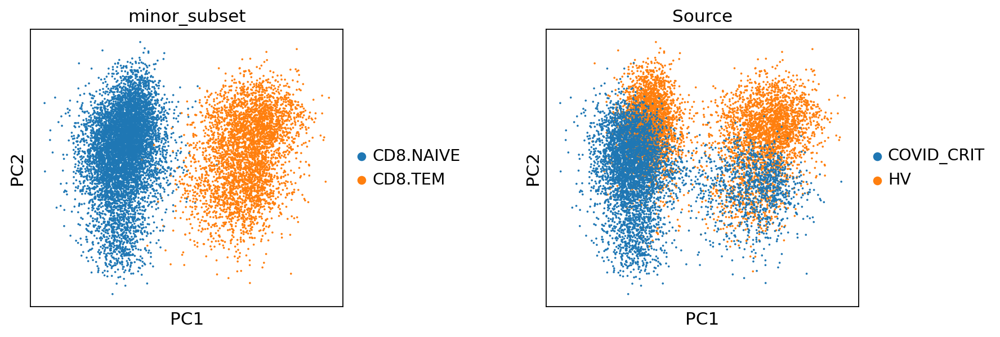

In [354]:
sc.pl.pca(subdata,components=['1,2'],color=['minor_subset','Source'],wspace=0.5)

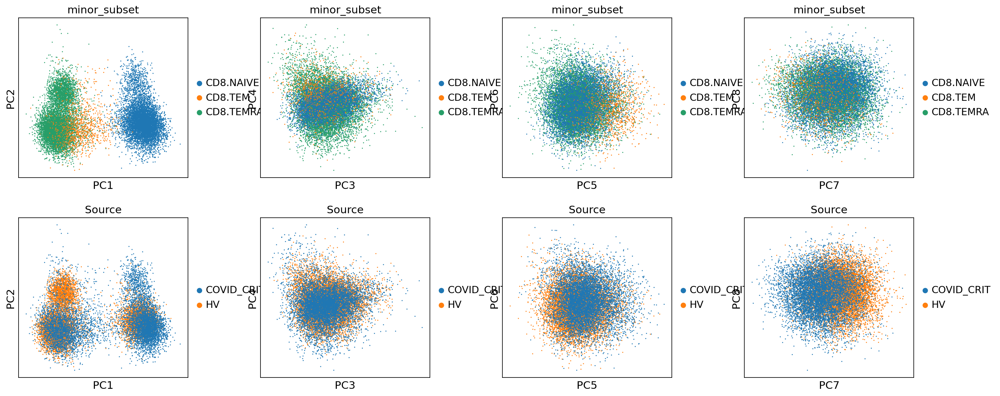

In [434]:
# subdata = subdata1[pc1.columns,:]
subdata = sc.concat([subdata1[data1.columns,:],subdata2[data2.columns,:]])
subdata.obsm['X_pca'] = np.concatenate([cell_rep1, cell_rep2]) #.drop(columns=[1])
# subdata.obsm['X_pca'] = np.concatenate([normalize(plsc0.x_weights_),normalize(plsc0.y_weights_)])
# subdata.obsm['X_pca'] = np.concatenate([plsc.x_loadings_, plsc.y_loadings_])


sc.pl.pca(subdata,components=['1,2','3,4','5,6','7,8'],color=['minor_subset','Source'],wspace=0.3)


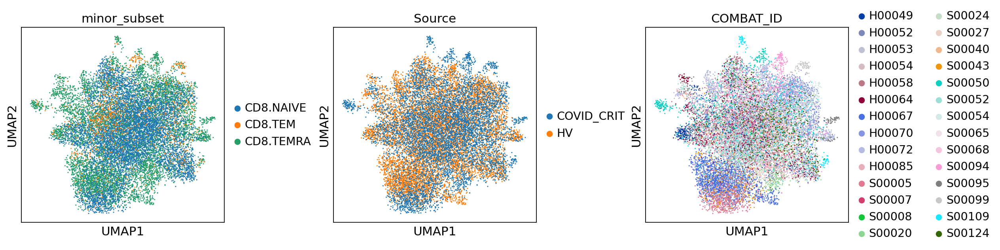

In [439]:
# subdata.obsm['X_pca'] = np.concatenate([subdata.obsm['X_pca'][:,:2],subdata.obsm['X_pca'][:,4:]],axis=1)
# subdata.obsm['X_pca'] = subdata.obsm['X_pca'][:,1:]

sc.pp.neighbors(subdata,use_rep='X_pca')
sc.tl.umap(subdata)
sc.pl.umap(subdata,color=['minor_subset','Source','COMBAT_ID'],wspace=0.4)

# sc.tl.leiden(subdata,resolution=0.25)
# sc.pl.umap(subdata,color=['minor_subset','leiden','Source'],wspace=0.4)

# sc.pl.pca(subdata,components=['1,2'],color=['minor_subset','leiden','Source'],wspace=0.4)

In [225]:
diffpc = {}
for i in range(50):
    diffpc[i+1] = bhattacharyya_distance(adata_pp[subdata1.obs_names,:].obsm['X_pca'][:,i],adata_pp[subdata2.obs_names,:].obsm['X_pca'][:,i])

IndexError: index 20 is out of bounds for axis 1 with size 20

In [200]:
diff0 = pd.Series(diff0)
subdata.obsm['X_pca_filt'] = np.array(pd.DataFrame(subdata.obsm['X_pca'],columns=range(1,21)).drop(columns=diffpc[diffpc>0.03].index))

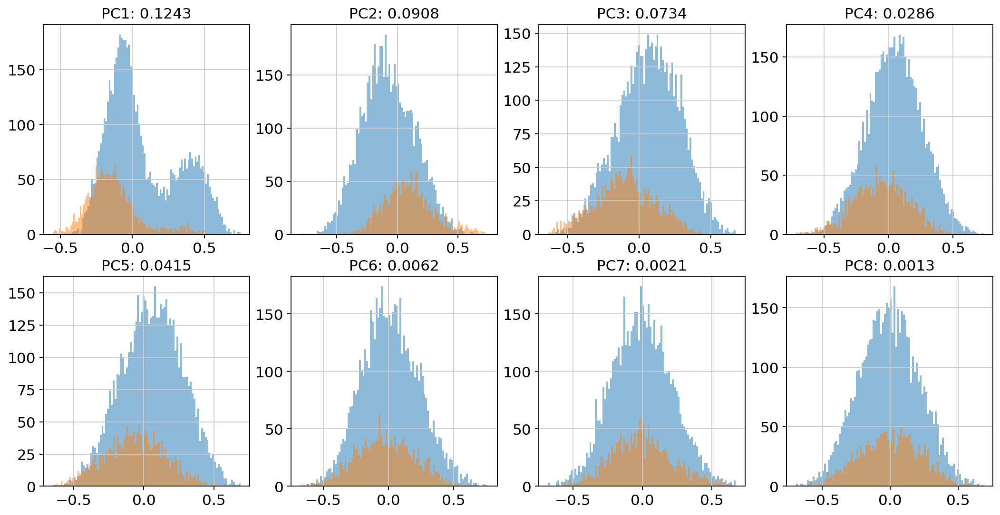

In [409]:
fig, axes = plt.subplots(2,4, figsize=(16,8))
for i in range(8):
    axes[int(i/4),i%4].hist(subdata[subdata1.obs_names,:].obsm['X_pca'][:,i],bins=100,alpha=0.5)
    axes[int(i/4),i%4].hist(subdata[subdata2.obs_names,:].obsm['X_pca'][:,i],bins=100,alpha=0.5)
    axes[int(i/4),i%4].set_title('PC'+str(i+1)+': '+str(diff0[i+1])[:6])

plt.show()

In [438]:
diff0 = pd.Series(diff0)
ce1 = np.concatenate([cell_rep1.drop(columns=diff[diff>0.03].index), cell_rep2.drop(columns=diff[diff>0.03].index)]) #
ce2 = np.concatenate([pd.DataFrame(plsc0.x_weights_,columns=range(1,21)).drop(columns=diff0[diff0>0.07].index),
        pd.DataFrame(plsc0.y_weights_,columns=range(1,21)).drop(columns=diff0[diff0>0.07].index)])
subdata.obsm['X_pca'] = np.concatenate([ce1,ce2],axis=1)

In [441]:
subdata.obsm['X_pca'].shape

(16292, 36)

In [476]:
cell_rep1, cell_rep2 = plsc.x_weights_, plsc.y_weights_
# plt.hist(cell_rep1,bins=100)
# plt.hist(cell_rep2,bins=100)
# plt.show()

# overlap = bhattacharyya_dist(cell_rep1.mean[0],cell_rep2.mean[0],
#             cell_rep1.std()[0,0],cell_rep2.std()[0,0])

diff = gm1or2(cell_rep1[:,1],cell_rep2[:,1])


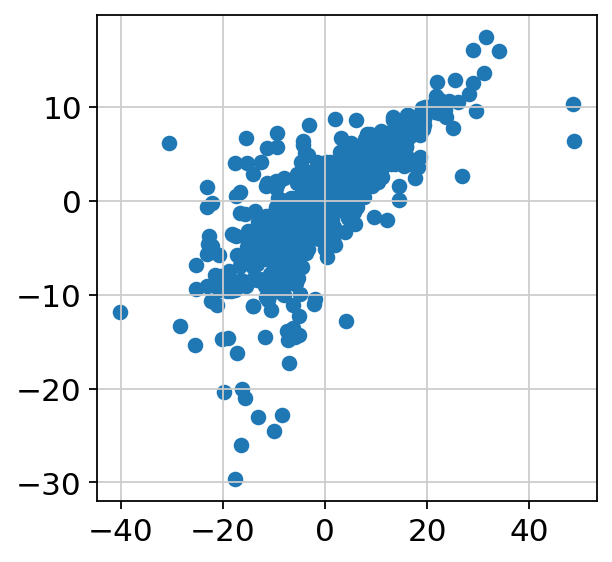

In [412]:
# gene_vec1, gene_vec2 = plsc._x_scores, plsc._y_scores
gene_vec1, gene_vec2 = plsc0.transform(data1, data2)
gene_vec1 = pd.DataFrame(index=data1.index, data=gene_vec1)
gene_vec2 = pd.DataFrame(index=data2.index, data=gene_vec2)

# plt.hist(gene_vec1.iloc[:,1],bins=100)
# plt.hist(gene_vec2.iloc[:,1],bins=100)
# plt.hist(plsc.x_loadings_[:,1],bins=100)
plt.scatter(gene_vec1.iloc[:,0], gene_vec2.iloc[:,0])
plt.show()

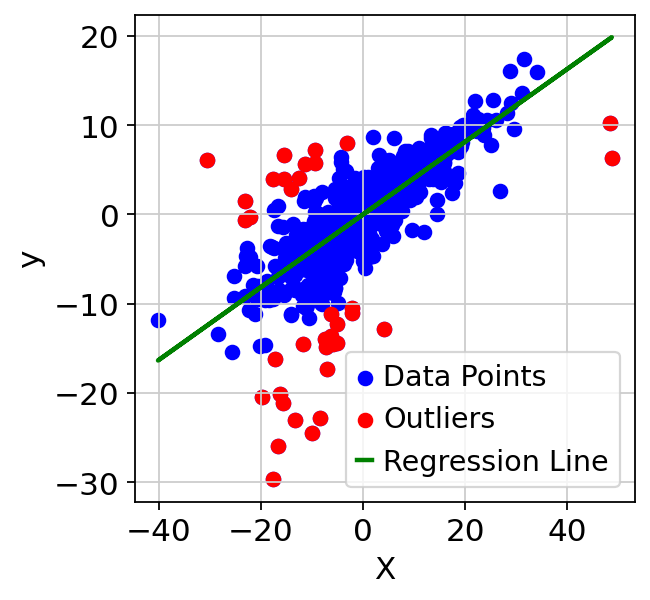

In [411]:
from sklearn.linear_model import LinearRegression


df = pd.DataFrame({'X': gene_vec1.iloc[:,0].squeeze(), 'y': gene_vec2.iloc[:,0]})

model = LinearRegression()
model.fit(df[['X']], df['y'])

# 计算预测值和残差
df['predicted'] = model.predict(df[['X']])
df['residuals'] = df['y'] - df['predicted']

# 设置异常点的阈值（例如3倍标准差）
threshold = 2.5 * df['residuals'].std()

# 识别异常点
outliers = df[np.abs(df['residuals']) > threshold]

plt.scatter(df['X'], df['y'], label='Data Points', color='blue')
plt.scatter(outliers['X'], outliers['y'], color='red', label='Outliers')
plt.plot(df['X'], df['predicted'], color='green', linewidth=2, label='Regression Line')
plt.xlabel('X')
plt.ylabel('y')
plt.legend()
plt.show()

In [359]:
outliers

,X,y,predicted,residuals
SELL,1.174277,10.564418,1.167550,9.396868
B3GNT2,-12.151500,-25.163129,-12.081884,-13.081244
GZMK,6.482071,-3.681658,6.444935,-10.126593
TRBV15,-6.917973,3.423510,-6.878340,10.301850
MYC,-0.508194,9.419826,-0.505282,9.925108
CCDC85B,-14.601864,-24.057194,-14.518209,-9.538984
CD69,-26.886668,-15.517094,-26.732634,11.215540
TOB1,-12.013103,1.364116,-11.944279,13.308396


In [406]:
good_genes = set()
# good_genes = set(pc1.index)

In [415]:
remove = True
# good_genes = set(good_genes)

data = gene_vec2
iqr = data.quantile([0.25, 0.5, 0.75])
iqr.loc['iqr', :] = (iqr.loc[0.75, :] - iqr.loc[0.25, :])
iqr.loc['min', :] = iqr.loc[0.25, :]-iqr.loc['iqr', :]
iqr.loc['max', :] = iqr.loc[0.75, :]+iqr.loc['iqr', :]

for i in range(0,5):
    if i == 0 and remove:
        good_genes.difference_update(data[data.iloc[:,0]<iqr.loc['min',0]].index)
        good_genes.difference_update(data[data.iloc[:,0]>iqr.loc['max',0]].index)
    else:
        good_genes.update(data[data.iloc[:,i]<iqr.loc['min',i]].index)
        good_genes.update(data[data.iloc[:,i]>iqr.loc['max',i]].index)
# good_genes = list(set(good_genes))


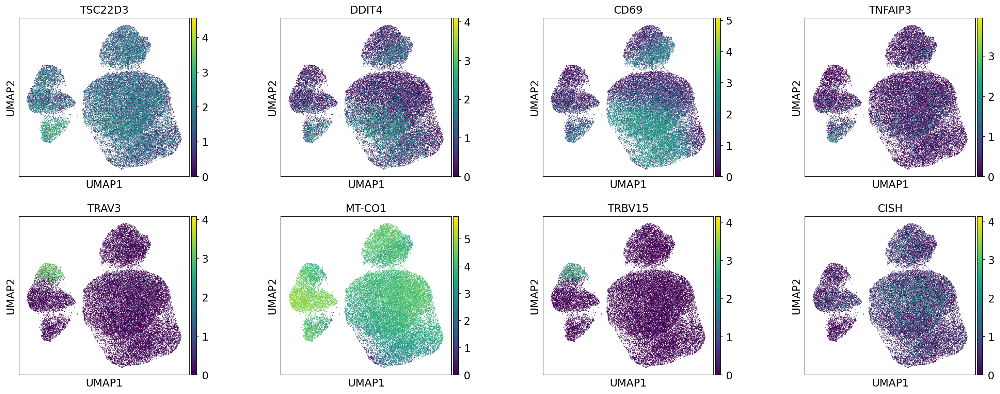

In [932]:
sc.pl.umap(subdata,color=markers,wspace=0.4)

In [413]:
# subdata = subdata[:,adata_pp.var_names]
sc.tl.rank_genes_groups(adata_pp, groupby='Source') #,groups=['CD8.TEMRA','CD8.NAIVE','CD4.NAIVE']
# adata_sub = adata_pp[adata_pp.obs['minor_subset']=='CD8.TEMRA']
# sc.tl.rank_genes_groups(adata_sub, groupby='Source')

/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/xinzhu/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


In [869]:
adata_sub.obs['Source'].cat.categories

Index(['COVID_CRIT', 'HV'], dtype='object')

In [414]:
marker_genes = pd.DataFrame(adata_pp.uns['rank_genes_groups']['names']).iloc[:500,:].T
num = 20
markers = sum(np.array(marker_genes.iloc[:,:num]).tolist(),[])
markers1 =np.array(marker_genes.iloc[0,:num]).tolist()
markers2 = np.array(marker_genes.iloc[1,:num]).tolist()
# markers3 = np.array(marker_genes.iloc[2,:num]).tolist()

In [794]:
adata_pp.var_names

Index(['AL031282.2', 'TNFRSF1B', 'VPS13D', 'EFHD2', 'SPEN', 'C1QB', 'LDLRAP1',
       'STMN1', 'ZNF683', 'FGR',
       ...
       'MX1', 'COL6A2', 'S100B', 'MT-ND1', 'MT-ND2', 'MT-ATP8', 'MT-ND4',
       'MT-ND6', 'MT-CYB', 'AC011043.1'],
      dtype='object', length=786)

Text(0.5, 1.0, 'Gene values in the FIRST vector')

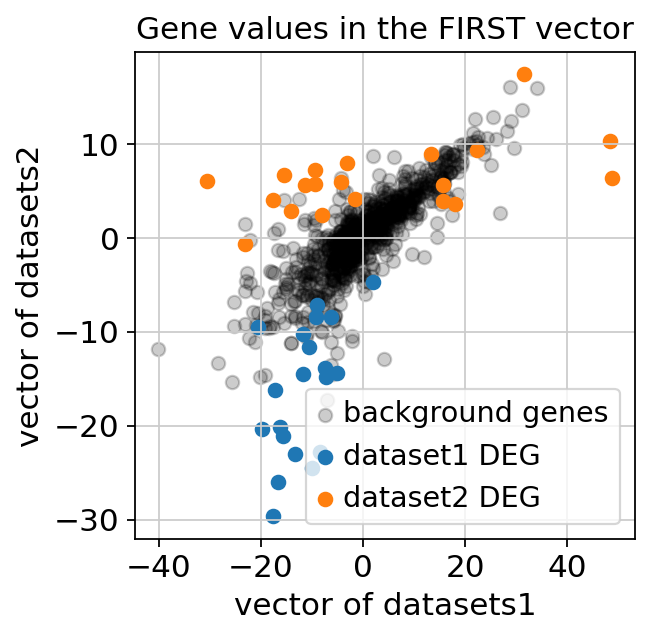

In [415]:
# g1 = np.dot(pc1,plsc.x_rotations_) 
# g2 = np.dot(pc2,plsc.y_rotations_) 
# # markers = adata_pp.var_names.intersection(markers)
# g1 = pd.DataFrame(index=adata_pp.var_names,data=g1)
# g2 = pd.DataFrame(index=adata_pp.var_names,data=g2)

g1, g2 = gene_vec1, gene_vec2
i = 0
plt.scatter(g1.loc[~g1.index.isin(markers),i],g2.loc[~g2.index.isin(markers),i],alpha=0.2,c='#000000')
plt.scatter(g1.loc[markers1,i],g2.loc[markers1,i],alpha=1)
plt.scatter(g1.loc[markers2,i],g2.loc[markers2,i],alpha=1)
# plt.scatter(g1.loc[markers3,i],g2.loc[markers3,i],alpha=1)

# plt.scatter(g2[:,0],g2[:,1],alpha=0.5)
# plt.legend(['background genes','CD8.NAIVE DEG','CD8.TEM DEG','CD8.TEMRA DEG',])
plt.legend(['background genes','dataset1 DEG','dataset2 DEG',])
plt.xlabel('vector of datasets1')
plt.ylabel('vector of datasets2')
plt.title('Gene values in the FIRST vector')

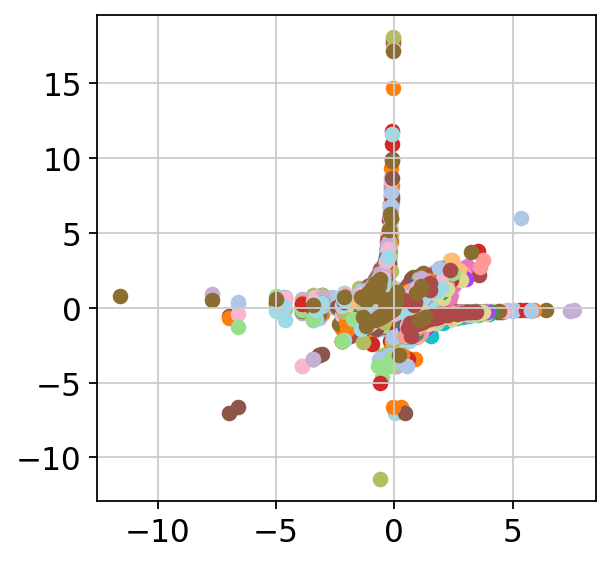

In [838]:
# plt.axes
for i in range(100):

    plt.scatter(adata_pp[subdata1.obs_names,markers1].X[i],adata_pp[subdata2.obs_names,markers1].X[i])
    plt.scatter(adata_pp[subdata1.obs_names,markers2].X[i],adata_pp[subdata2.obs_names,markers2].X[i])


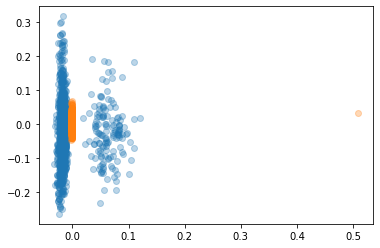

In [132]:
# cca.x_rotations_.shape
# cca._x_scores.shape
score = cca._x_scores
loading = cca.x_loadings_
# z = np.dot(pc1,score.T)
x_ = np.dot(score,loading.T)
score = plsc._x_scores
loading = plsc.x_loadings_
# score = gcca.transform([pc1,pc2])[0]
# loading = gcca.h_list[0]
x__ = np.dot(score,loading.T)

# x__ = np.outer(loading[:,0],score[:,0].T).T
plt.scatter(pc1.iloc[0,:],x_[0,:],alpha=0.3)
plt.scatter(pc1.iloc[1,:],x__[1,:],alpha=0.3)

# for i in range(len(pc1)):
#     # plt.scatter(pc1.iloc[i,:],x_[i,:],alpha=0.3)
#     plt.scatter(pc1.iloc[i,:],x__[i,:],alpha=0.3)

In [133]:
x___=np.dot(adata_pp.varm['PCs'],adata_pp[pc1.columns].obsm['X_pca'].T)
# corr = np.corrcoef(x___.T,adata_pp[pc1.columns,:].X.toarray())
corr = np.corrcoef(x__.T,pc1.values.T)
# cov = np.cov(x__.T,pc1.values.T)
# abs(corr[:938,938:]).trace()/938
# abs(corr[:100,100:]).trace()/100
abs(corr[:1000,1000:]).trace()/1000
# np.mean(corr[1000:,:1000]**2)

0.17733137482463132

In [79]:
corr[:1000,1000:][2,2]

0.4260631834548749

## Influence of variation and covariation (Sxx)

In [729]:
### influence of variation and covariation (Sxx)

import numpy as np
from sklearn.preprocessing import normalize

n = 4000
noise = int(n/2)
# 2 latents vars:
l1 = np.random.normal(size=(n,1))
l2 = np.random.normal(size=(n,1))+2
l3 = np.random.normal(size=(n,1))+4
l4 = np.random.normal(size=(n,1))+6
l0 = np.random.normal(size=(noise,1))

nvar = 400
latents1 = l1*2+np.ones(shape=(n,nvar))*0.1
latents2 = l2*2+np.ones(shape=(n,nvar))*0.1
latents3 = l3*2+np.ones(shape=(n,nvar))*0.1
latents4 = l4*2+np.ones(shape=(n,nvar))*0.1
latents0 = l0*2+np.ones(shape=(noise,nvar*2))*0.1


latents = np.concatenate([latents1, latents2],axis=1)
# latents = np.concatenate([latents, latents3],axis=1)
latents = np.concatenate([latents,latents0],axis=0)
X = latents + np.random.normal(size=latents.shape[1] * latents.shape[0]).reshape((latents.shape[0], latents.shape[1]))
latents = np.concatenate([latents1, latents4],axis=1)
# latents = np.concatenate([latents, latents3],axis=1)
latents = np.concatenate([latents,latents0],axis=0)
Y = latents + np.random.normal(size=latents.shape[1] * latents.shape[0]).reshape((latents.shape[0], latents.shape[1]))

# X = normalize(X,axis=1,norm='l1')
# Y = normalize(Y,axis=1,norm='l1')
# X = normalize(X,axis=0,norm='l1')
# Y = normalize(Y,axis=0,norm='l1')

X_train = X[: n // 2]
Y_train = Y[: n // 2]
# X_test = X[n // 2 :]
# Y_test = Y[n // 2 :]

print("Corr(X)")
print(np.round(np.corrcoef(X.T), 2))
print("Corr(Y)")
print(np.round(np.corrcoef(Y.T), 2))

Corr(X)
[[1.   0.8  0.8  ... 0.2  0.21 0.22]
 [0.8  1.   0.8  ... 0.21 0.21 0.21]
 [0.8  0.8  1.   ... 0.21 0.21 0.22]
 ...
 [0.2  0.21 0.21 ... 1.   0.89 0.88]
 [0.21 0.21 0.21 ... 0.89 1.   0.88]
 [0.22 0.21 0.22 ... 0.88 0.88 1.  ]]
Corr(Y)
[[1.   0.79 0.79 ... 0.1  0.1  0.1 ]
 [0.79 1.   0.8  ... 0.1  0.1  0.1 ]
 [0.79 0.8  1.   ... 0.11 0.1  0.11]
 ...
 [0.1  0.1  0.11 ... 1.   0.97 0.97]
 [0.1  0.1  0.1  ... 0.97 1.   0.97]
 [0.1  0.1  0.11 ... 0.97 0.97 1.  ]]


In [414]:
# np.sum(X**2,axis=0)
sum(np.cov(X[:,:nvar].T)**2).sum()

678514.2467227888

In [730]:
from sklearn.cross_decomposition import PLSCanonical, CCA, PLSRegression

plsca = PLSCanonical(n_components=4)
plsca.fit(X,Y)

cca = CCA(n_components=4,max_iter=1000)
cca.fit(X, Y)

plscr = PLSRegression(n_components=4)
plscr.fit(X,Y)

PLSRegression(n_components=4)

Text(0, 0.5, 'weight2')

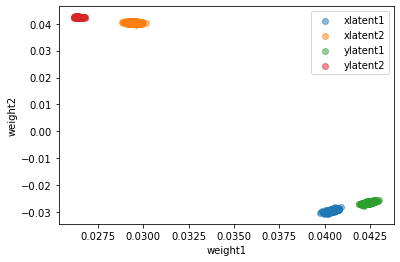

In [731]:
import matplotlib.pyplot as plt

X_loading = plsca.x_weights_
Y_loading = plsca.y_weights_
plt.scatter(X_loading[:nvar,0],X_loading[:nvar,1],alpha=0.5)
# plt.scatter(X_loading[nvar:2*nvar,0],X_loading[nvar:2*nvar,-1])
plt.scatter(X_loading[nvar:,0],X_loading[nvar:,1],alpha=0.5)
# plt.legend(['xlatent1','xlatent2'])#,'latent3'
# plt.show()
plt.scatter(Y_loading[:nvar,0],Y_loading[:nvar,1],alpha=0.5)
# plt.scatter(Y_loading[nvar:2*nvar,0],Y_loading[nvar:2*nvar,-1])
plt.scatter(Y_loading[nvar:,0],Y_loading[nvar:,1],alpha=0.5)
plt.legend(['xlatent1','xlatent2','ylatent1','ylatent2'])
plt.xlabel('weight1')
plt.ylabel('weight2')

Text(0.5, 1.0, 'Transformed')

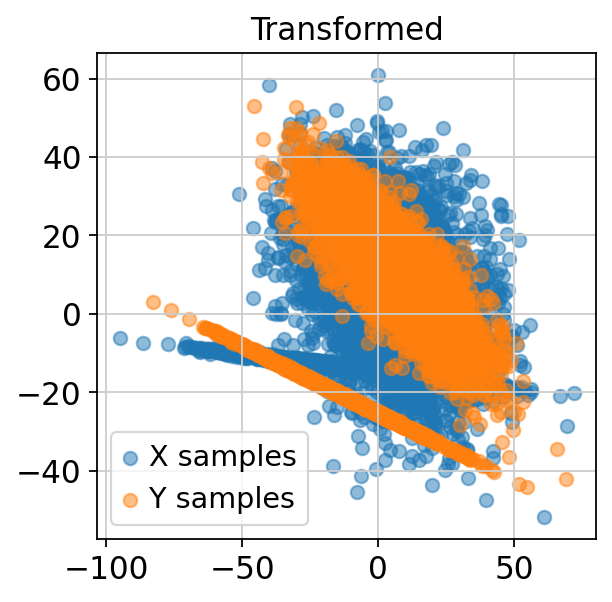

In [769]:
X_r, Y_r = plsca.transform(X, Y)


# plt.scatter(X_r[:,0],Y_r[:,0])

plt.scatter(X_r[:,0],X_r[:,1],alpha=0.5)
plt.scatter(Y_r[:,0],Y_r[:,1],alpha=0.5)
# plt.scatter(Y_r[:n,0],Y_r[:n,1],alpha=0.5)
# plt.scatter(Y_r[n:,0],Y_r[n:,1],alpha=0.5)

# plt.scatter(X.T[:,0],X.T[:,1],alpha=0.5)
# plt.scatter(Y.T[:,0],Y.T[:,1],alpha=0.5)
# plt.scatter(X_loading[nvar:2*nvar,0],X_loading[nvar:2*nvar,-1])
# plt.scatter(X_loading[nvar:,0],X_loading[nvar:,-1])
# plt.legend(['latent1','latent2','latent3'])
# plt.legend(['DE genes','noise genes'])
plt.legend(['X samples','Y samples'])
plt.title('Transformed')


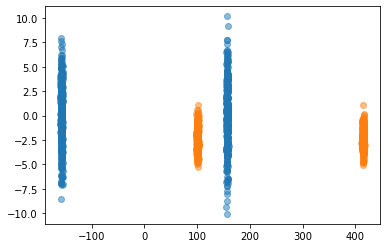

In [656]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(X.T)
X_d = pca.transform(X.T)
Y_d = pca.transform(Y.T)
# X_d = pca.fit_transform(X.T)
# pca = PCA(n_components=2)
# Y_d = pca.fit_transform(Y.T)
plt.scatter(X_d[:,0], X_d[:,1], alpha=0.5)
plt.scatter(Y_d[:,0], Y_d[:,1], alpha=0.5)

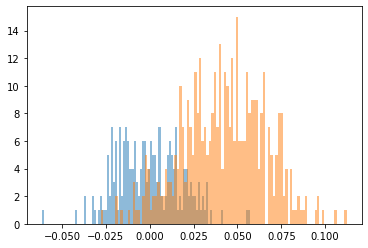

In [481]:
plt.hist(X_loading[:nvar,1],bins=100,alpha=0.5)
plt.hist(X_loading[nvar:,1],bins=100,alpha=0.5)
plt.show()

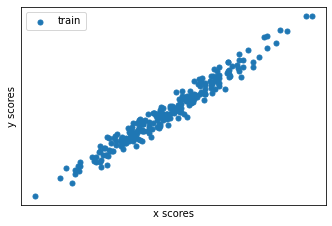

In [24]:
plt.figure(figsize=(12, 8))
plt.subplot(221)
# plt.scatter(X[:, 0], X[:, -1], label="train", marker="o", s=25)
plt.scatter(X_train_r[:, 1], Y_train_r[:, 1], label="train", marker="o", s=25)

plt.xlabel("x scores")
plt.ylabel("y scores")

plt.xticks(())
plt.yticks(())
plt.legend(loc="best")